In [ ]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

In [3]:
pip install opendatasets

Note: you may need to restart the kernel to use updated packages.


In [4]:
import opendatasets as od

In [5]:
od.download("https://www.kaggle.com/datasets/greatgamedota/ffhq-face-data-set")

Skipping, found downloaded files in "./ffhq-face-data-set" (use force=True to force download)


In [6]:
dataset_dir = '/kaggle/working/ffhq-face-data-set/thumbnails128x128/'

In [8]:
import os
from tqdm import tqdm
from PIL import Image as Img
import tensorflow as tf
import numpy as np

In [9]:
images = []
files = os.listdir(dataset_dir)

ct=0
for i in tqdm(files):
  if ct<=25000:
    pic = Img.open(dataset_dir + i)
    pic = pic.resize((128, 128))
    pic = pic.convert('RGB')
    images.append(np.float32(pic) / 255)
    ct+=1
  else:
    break

 36%|███▌      | 25001/70000 [00:29<00:52, 859.45it/s]


In [10]:
del files
del ct

In [11]:
images = np.array(images)

In [12]:
print(images.shape)
print(type(images))
print(images[0].shape)
print(images[0].dtype)

(25001, 128, 128, 3)
<class 'numpy.ndarray'>
(128, 128, 3)
float32


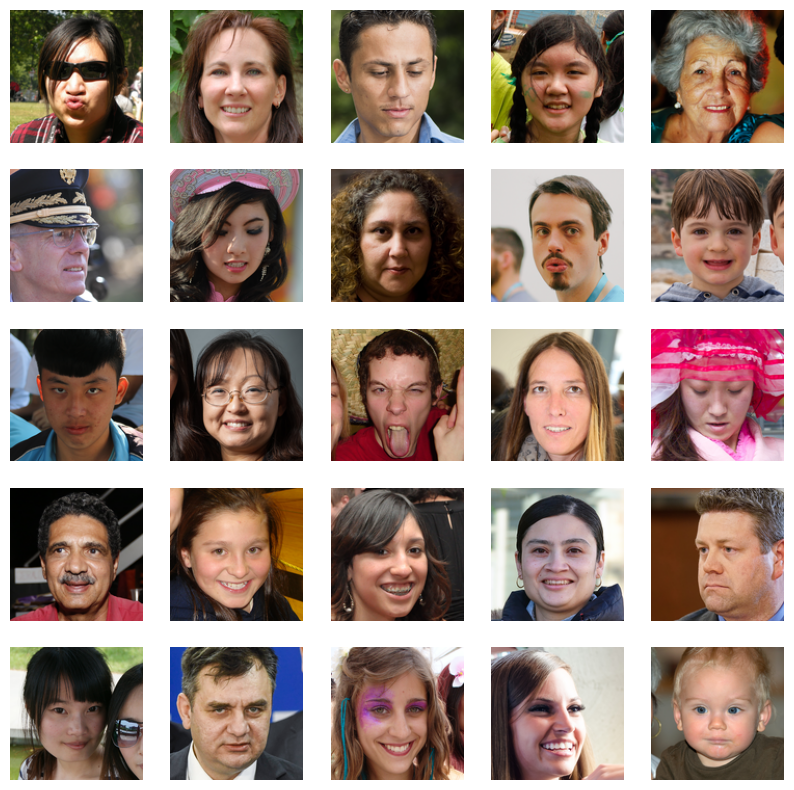

In [13]:
from matplotlib import pyplot as plt

plt.figure(1, figsize=(10, 10))

for i in range(25):
    plt.subplot(5, 5, i+1)
    plt.imshow(images[i])
    plt.axis('off')
plt.show()

In [14]:
from tensorflow import keras
from tensorflow.keras import layers

noise_dim = 100

def generator():
  gen_model = keras.Sequential([

      #Input
      layers.Dense(128*128*3, use_bias=False, input_shape=(noise_dim,)),
      layers.Reshape((128,128,3)),

      #Downsample
      layers.Conv2D(filters=128, kernel_size=4, strides=1, padding='same', kernel_initializer='he_normal', use_bias=False),
      layers.Conv2D(filters=128, kernel_size=4, strides=2, padding='same', kernel_initializer='he_normal', use_bias=False),
      layers.BatchNormalization(),
      layers.LeakyReLU(),

      layers.Conv2D(filters=256, kernel_size=4, strides=1, padding='same', kernel_initializer='he_normal', use_bias=False),
      layers.Conv2D(filters=256, kernel_size=4, strides=2, padding='same', kernel_initializer='he_normal', use_bias=False),
      layers.BatchNormalization(),
      layers.LeakyReLU(),

      layers.Conv2DTranspose(filters=512, kernel_size=4, strides=1, padding='same', kernel_initializer='he_normal', use_bias=False),
      layers.Conv2D(filters=512, kernel_size=4, strides=2, padding='same', kernel_initializer='he_normal', use_bias=False),
      layers.LeakyReLU(),

      #Upsample
      layers.Conv2DTranspose(filters=512, kernel_size=4, strides=1, padding='same', kernel_initializer='he_normal', use_bias=False),
      layers.Conv2DTranspose(filters=512, kernel_size=4, strides=2, padding='same', kernel_initializer='he_normal', use_bias=False),
      layers.BatchNormalization(),
      layers.LeakyReLU(),

      layers.Conv2DTranspose(filters=256, kernel_size=4, strides=1, padding='same', kernel_initializer='he_normal', use_bias=False),
      layers.Conv2DTranspose(filters=256, kernel_size=4, strides=2, padding='same', kernel_initializer='he_normal', use_bias=False),
      layers.BatchNormalization(),

      layers.Conv2DTranspose(filters=128, kernel_size=4, strides=2, padding='same', kernel_initializer='he_normal', use_bias=False),
      layers.Conv2DTranspose(filters=128, kernel_size=4, strides=1, padding='same', kernel_initializer='he_normal', use_bias=False),
      layers.BatchNormalization(),

      layers.Conv2DTranspose(filters=3, kernel_size=4, strides = 1, padding = 'same', activation = 'tanh')

  ])

  return gen_model

In [15]:
generator = generator()
generator.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense (Dense)               (None, 49152)             4915200   
                                                                 
 reshape (Reshape)           (None, 128, 128, 3)       0         
                                                                 
 conv2d (Conv2D)             (None, 128, 128, 128)     6144      
                                                                 
 conv2d_1 (Conv2D)           (None, 64, 64, 128)       262144    
                                                                 
 batch_normalization (BatchN  (None, 64, 64, 128)      512       
 ormalization)                                                   
                                                                 
 leaky_re_lu (LeakyReLU)     (None, 64, 64, 128)       0         
                                                        

In [16]:
def discriminator():
  disc_model = keras.Sequential([

      layers.Conv2D(filters=128, kernel_size=4, strides=2, padding='same', input_shape=(128,128,3), kernel_initializer='he_normal', use_bias=False),
      layers.BatchNormalization(),
      layers.LeakyReLU(),

      layers.Conv2D(filters=128, kernel_size=4, strides=2, padding='same', kernel_initializer='he_normal', use_bias=False),
      layers.BatchNormalization(),
      layers.LeakyReLU(),

      layers.Conv2D(filters=256, kernel_size=4, strides=2, padding='same', kernel_initializer='he_normal', use_bias=False),
      layers.BatchNormalization(),
      layers.LeakyReLU(),

      layers.Conv2D(filters=256, kernel_size=4, strides=2, padding='same', kernel_initializer='he_normal', use_bias=False),
      layers.BatchNormalization(),
      layers.LeakyReLU(),

      layers.Conv2D(filters=512, kernel_size=4, strides=2, padding='same'),
      layers.LeakyReLU(),

      layers.Flatten(),
      layers.Dense(1, activation = 'sigmoid'),
  ])
  return disc_model

In [17]:
discriminator = discriminator()
discriminator.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_5 (Conv2D)           (None, 64, 64, 128)       6144      
                                                                 
 batch_normalization_5 (Batc  (None, 64, 64, 128)      512       
 hNormalization)                                                 
                                                                 
 leaky_re_lu_4 (LeakyReLU)   (None, 64, 64, 128)       0         
                                                                 
 conv2d_6 (Conv2D)           (None, 32, 32, 128)       262144    
                                                                 
 batch_normalization_6 (Batc  (None, 32, 32, 128)      512       
 hNormalization)                                                 
                                                                 
 leaky_re_lu_5 (LeakyReLU)   (None, 32, 32, 128)      

In [18]:
noise = np.random.normal(-1,1,(1,100))
img = generator(noise)

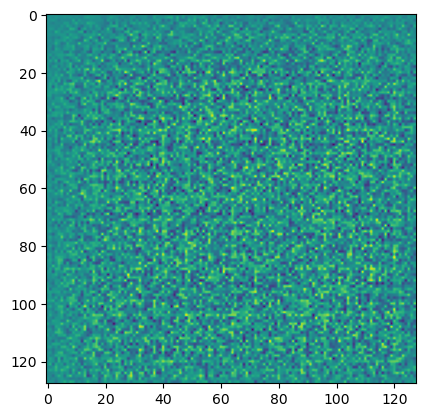

TensorShape([1, 128, 128, 3])

In [19]:
plt.imshow(img[0,:,:,0])
plt.show()
img.shape

In [21]:
decision = discriminator(img)
print(decision)

tf.Tensor([[0.45220593]], shape=(1, 1), dtype=float32)


In [22]:
del noise
del img
del decision

In [23]:
from tensorflow.keras import losses
cross_entropy = losses.BinaryCrossentropy(from_logits=True)

In [24]:
def discriminator_loss(real_output, fake_output):
    real_loss = cross_entropy(tf.ones_like(real_output), real_output)
    fake_loss = cross_entropy(tf.zeros_like(fake_output), fake_output)
    total_loss = real_loss + fake_loss
    return total_loss

In [25]:
def generator_loss(fake_output):
    return cross_entropy(tf.ones_like(fake_output), fake_output)

In [26]:
from tensorflow.keras import optimizers
generator_optimizer = optimizers.Adam(1e-4)
discriminator_optimizer = optimizers.Adam(1e-4)

In [27]:
EPOCHS = 35
BATCH_SIZE = 32

In [28]:
def train_step(images):

    noise = tf.random.normal([BATCH_SIZE, noise_dim])

    with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:

      generated_images = generator(noise, training=True)

      real_output = discriminator(images, training=True)
      fake_output = discriminator(generated_images, training=True)

      gen_loss = generator_loss(fake_output)
      disc_loss = discriminator_loss(real_output, fake_output)

    gradients_of_generator = gen_tape.gradient(gen_loss, generator.trainable_variables)
    gradients_of_discriminator = disc_tape.gradient(disc_loss, discriminator.trainable_variables)

    generator_optimizer.apply_gradients(zip(gradients_of_generator, generator.trainable_variables))
    discriminator_optimizer.apply_gradients(zip(gradients_of_discriminator, discriminator.trainable_variables))

    loss = {'Generator loss': gen_loss,
           'Discriminator loss': disc_loss}

    return loss

In [29]:
import time
gen_loss_list = []
disc_loss_list = []
def final_train(epochs,image_dataset):
    for epoch in tqdm(range(epochs)):
        start = time.time()
        print("\nEpoch : {}".format(epoch + 1))
        for images in image_dataset:
            loss = train_step(images)
        if (epoch + 1) % 5 == 0:
          checkpoint.save(file_prefix = checkpoint_prefix)
        generate_images(5, epoch+1, 0)
        gen_loss_list.append(loss['Generator loss'])
        disc_loss_list.append(loss['Discriminator loss'])
        print("\nTime: {} secs".format(np.round(time.time() - start),2))
        print("Generator Loss: {} Discriminator Loss: {}".format(loss['Generator loss'],loss['Discriminator loss']))

In [30]:
batches = np.array_split(images, images.shape[0] // BATCH_SIZE)

In [31]:
del images

In [32]:
import time

def generate_images(size = 5, epochs = 0, randomize = 1):
  plt.figure(figsize = (10,10))

  for i in range(size * size):
    plt.subplot(size, size, i+1)
    if randomize==1:
      seed = int(time.time())
    else:
      seed = 69
    np.random.seed(seed)
    noise = np.random.normal(0,1,(1,noise_dim))
    pic = generator(noise)

    plt.imshow(np.clip((pic[0,...]+1)/2, 0, 1))

    plt.xticks([])
    plt.yticks([])
    plt.grid()

In [33]:
epoch_list = range(1, EPOCHS+1)

def plot_loss(gen_loss_list, disc_loss_list, epoch_list):

  plt.plot(epoch_list, gen_loss_list)
  plt.xlabel('Epoch')
  plt.ylabel('Generator Loss')
  plt.title('Generator Loss vs EPOCH')

  plt.show()

  plt.plot(epoch_list, disc_loss_list)
  plt.xlabel('Epoch')
  plt.ylabel('Discriminator Loss')
  plt.title('Discriminator Loss vs EPOCH')

  plt.show()

In [40]:
checkpoint_dir = '/kaggle/working/training_checkpoints'
# os.makedirs(checkpoint_dir)

checkpoint_prefix = os.path.join(checkpoint_dir, "ckpt")
checkpoint = tf.train.Checkpoint(generator=generator, discriminator=discriminator)

In [39]:
for root, dirs, files in os.walk(checkpoint_dir):
    for file in files:
        file_path = os.path.join(root, file)
        os.remove(file_path)

    for dir in dirs:
        dir_path = os.path.join(root, dir)
        os.rmdir(dir_path)

  0%|          | 0/35 [00:00<?, ?it/s]


Epoch : 1


  3%|▎         | 1/35 [11:42<6:38:10, 702.66s/it]


Time: 703.0 secs
Generator Loss: 3.9520626068115234 Discriminator Loss: 0.08662228286266327

Epoch : 2


  6%|▌         | 2/35 [23:25<6:26:32, 702.81s/it]


Time: 703.0 secs
Generator Loss: 7.474449157714844 Discriminator Loss: 0.06743038445711136

Epoch : 3


  9%|▊         | 3/35 [35:08<6:14:49, 702.79s/it]


Time: 703.0 secs
Generator Loss: 4.674456596374512 Discriminator Loss: 0.36038845777511597

Epoch : 4


 11%|█▏        | 4/35 [46:50<6:03:03, 702.69s/it]


Time: 703.0 secs
Generator Loss: 8.03738021850586 Discriminator Loss: 0.012272564694285393

Epoch : 5


 14%|█▍        | 5/35 [58:33<5:51:18, 702.61s/it]


Time: 702.0 secs
Generator Loss: 6.323583126068115 Discriminator Loss: 0.023275749757885933

Epoch : 6


 17%|█▋        | 6/35 [1:10:15<5:39:33, 702.55s/it]


Time: 702.0 secs
Generator Loss: 3.446516752243042 Discriminator Loss: 0.17030024528503418

Epoch : 7


 20%|██        | 7/35 [1:21:57<5:27:42, 702.24s/it]


Time: 702.0 secs
Generator Loss: 6.8787994384765625 Discriminator Loss: 0.015757910907268524

Epoch : 8


 23%|██▎       | 8/35 [1:33:38<5:15:51, 701.90s/it]


Time: 701.0 secs
Generator Loss: 12.474312782287598 Discriminator Loss: 0.02703411504626274

Epoch : 9


 26%|██▌       | 9/35 [1:45:19<5:03:59, 701.54s/it]


Time: 701.0 secs
Generator Loss: 7.619053363800049 Discriminator Loss: 0.006273050792515278

Epoch : 10


 29%|██▊       | 10/35 [1:57:00<4:52:13, 701.34s/it]


Time: 701.0 secs
Generator Loss: 16.588321685791016 Discriminator Loss: 0.01382099837064743

Epoch : 11


 31%|███▏      | 11/35 [2:08:41<4:40:30, 701.29s/it]


Time: 701.0 secs
Generator Loss: 10.96703815460205 Discriminator Loss: 0.001431558164767921

Epoch : 12


 34%|███▍      | 12/35 [2:20:22<4:28:45, 701.11s/it]


Time: 701.0 secs
Generator Loss: 8.006331443786621 Discriminator Loss: 0.0017203778261318803

Epoch : 13


 37%|███▋      | 13/35 [2:32:02<4:17:02, 701.01s/it]


Time: 701.0 secs
Generator Loss: 21.81674575805664 Discriminator Loss: 0.0013050584821030498

Epoch : 14


 40%|████      | 14/35 [2:43:43<4:05:20, 700.99s/it]


Time: 701.0 secs
Generator Loss: 10.511425971984863 Discriminator Loss: 0.0009949947707355022

Epoch : 15


 43%|████▎     | 15/35 [2:55:24<3:53:37, 700.89s/it]


Time: 701.0 secs
Generator Loss: 8.070619583129883 Discriminator Loss: 0.06179582700133324

Epoch : 16


 46%|████▌     | 16/35 [3:07:05<3:41:55, 700.81s/it]


Time: 701.0 secs
Generator Loss: 6.543847560882568 Discriminator Loss: 0.05506112426519394

Epoch : 17


 49%|████▊     | 17/35 [3:18:47<3:30:20, 701.15s/it]


Time: 702.0 secs
Generator Loss: 11.741434097290039 Discriminator Loss: 0.0006956724682822824

Epoch : 18


 51%|█████▏    | 18/35 [3:30:29<3:18:44, 701.43s/it]


Time: 702.0 secs
Generator Loss: 8.400956153869629 Discriminator Loss: 0.006928676273673773

Epoch : 19


 54%|█████▍    | 19/35 [3:42:11<3:07:08, 701.80s/it]


Time: 703.0 secs
Generator Loss: 26.27916717529297 Discriminator Loss: 6.178564149195154e-08

Epoch : 20


 57%|█████▋    | 20/35 [3:53:54<2:55:31, 702.12s/it]


Time: 703.0 secs
Generator Loss: 16.112960815429688 Discriminator Loss: 0.016209207475185394

Epoch : 21


/tmp/ipykernel_28/3707488124.py:4: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure(figsize = (10,10))
 60%|██████    | 21/35 [4:05:37<2:43:50, 702.21s/it]


Time: 702.0 secs
Generator Loss: 28.58676528930664 Discriminator Loss: 0.27802056074142456

Epoch : 22


 63%|██████▎   | 22/35 [4:17:19<2:32:10, 702.34s/it]


Time: 703.0 secs
Generator Loss: 13.655803680419922 Discriminator Loss: 0.0010099420323967934

Epoch : 23


 66%|██████▌   | 23/35 [4:29:02<2:20:29, 702.46s/it]


Time: 703.0 secs
Generator Loss: 27.537334442138672 Discriminator Loss: 0.004371886607259512

Epoch : 24


 69%|██████▊   | 24/35 [4:40:45<2:08:47, 702.52s/it]


Time: 703.0 secs
Generator Loss: 22.363096237182617 Discriminator Loss: 1.7462065443396568e-05

Epoch : 25


 71%|███████▏  | 25/35 [4:52:28<1:57:08, 702.86s/it]


Time: 704.0 secs
Generator Loss: 30.4697265625 Discriminator Loss: 4.681209975387901e-05

Epoch : 26


 74%|███████▍  | 26/35 [5:04:12<1:45:27, 703.02s/it]


Time: 703.0 secs
Generator Loss: 4.73833703994751 Discriminator Loss: 0.0485210083425045

Epoch : 27


 77%|███████▋  | 27/35 [5:15:55<1:33:45, 703.23s/it]


Time: 704.0 secs
Generator Loss: 5.527596950531006 Discriminator Loss: 0.03662104159593582

Epoch : 28


 80%|████████  | 28/35 [5:27:39<1:22:02, 703.23s/it]


Time: 703.0 secs
Generator Loss: 12.622905731201172 Discriminator Loss: 0.00022803682077210397

Epoch : 29


 83%|████████▎ | 29/35 [5:39:22<1:10:19, 703.20s/it]


Time: 703.0 secs
Generator Loss: 6.984462738037109 Discriminator Loss: 0.0019746937323361635

Epoch : 30


 86%|████████▌ | 30/35 [5:51:05<58:36, 703.30s/it]  


Time: 704.0 secs
Generator Loss: 11.854938507080078 Discriminator Loss: 6.548337842104957e-05

Epoch : 31


 89%|████████▊ | 31/35 [6:02:49<46:53, 703.31s/it]


Time: 703.0 secs
Generator Loss: 6.826911926269531 Discriminator Loss: 0.5870584845542908

Epoch : 32


 91%|█████████▏| 32/35 [6:14:32<35:10, 703.36s/it]


Time: 703.0 secs
Generator Loss: 10.714841842651367 Discriminator Loss: 9.159692854154855e-05

Epoch : 33


 94%|█████████▍| 33/35 [6:26:15<23:26, 703.36s/it]


Time: 703.0 secs
Generator Loss: 10.539901733398438 Discriminator Loss: 0.012440191581845284

Epoch : 34


 97%|█████████▋| 34/35 [6:38:00<11:43, 703.64s/it]


Time: 704.0 secs
Generator Loss: 7.064688205718994 Discriminator Loss: 0.012588836252689362

Epoch : 35


100%|██████████| 35/35 [6:49:43<00:00, 702.39s/it]


Time: 703.0 secs
Generator Loss: 6.282505989074707 Discriminator Loss: 0.01886865124106407


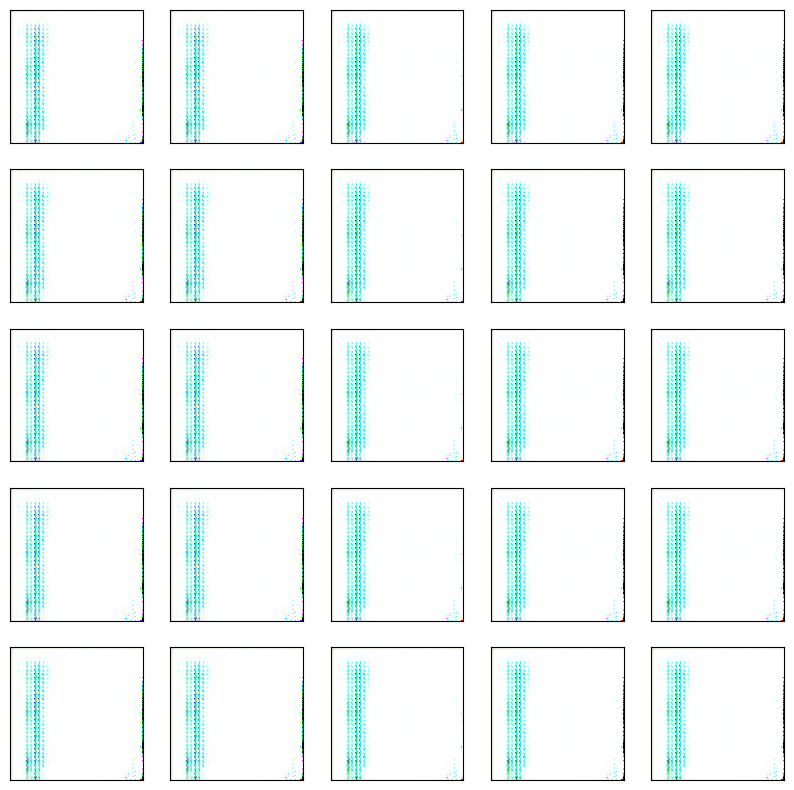

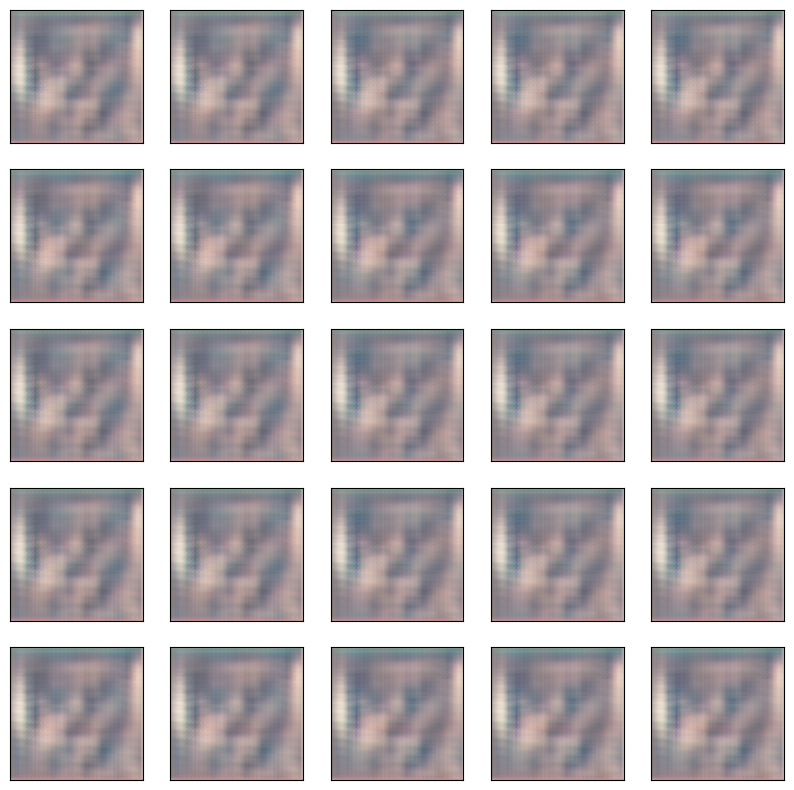

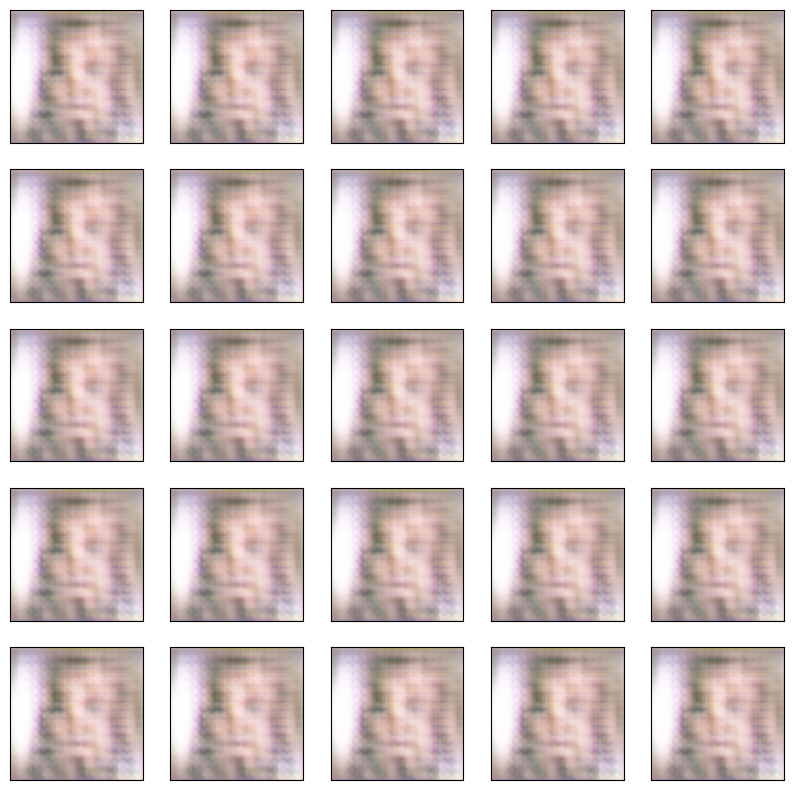

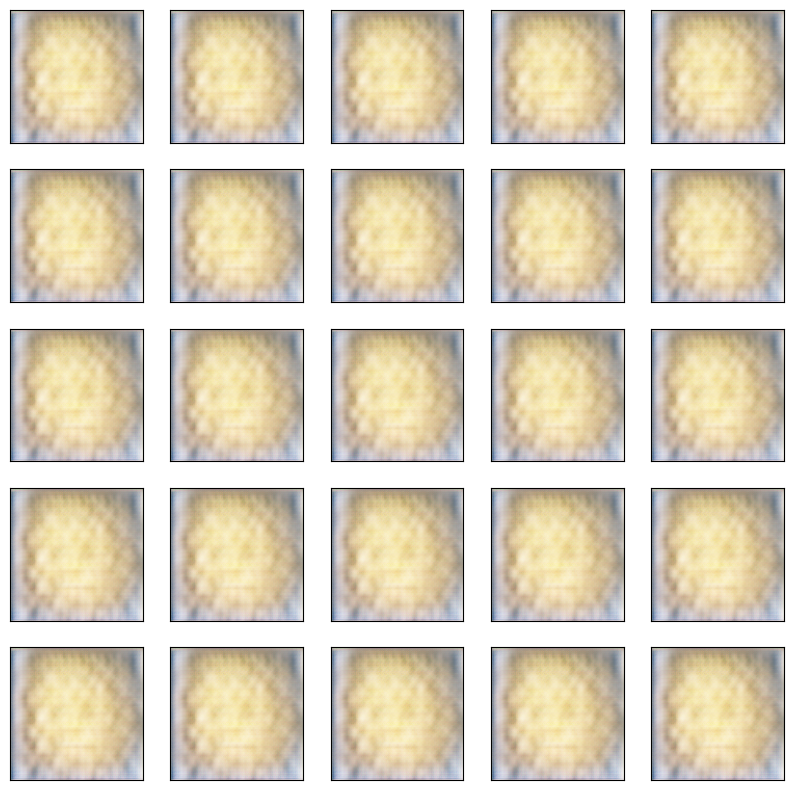

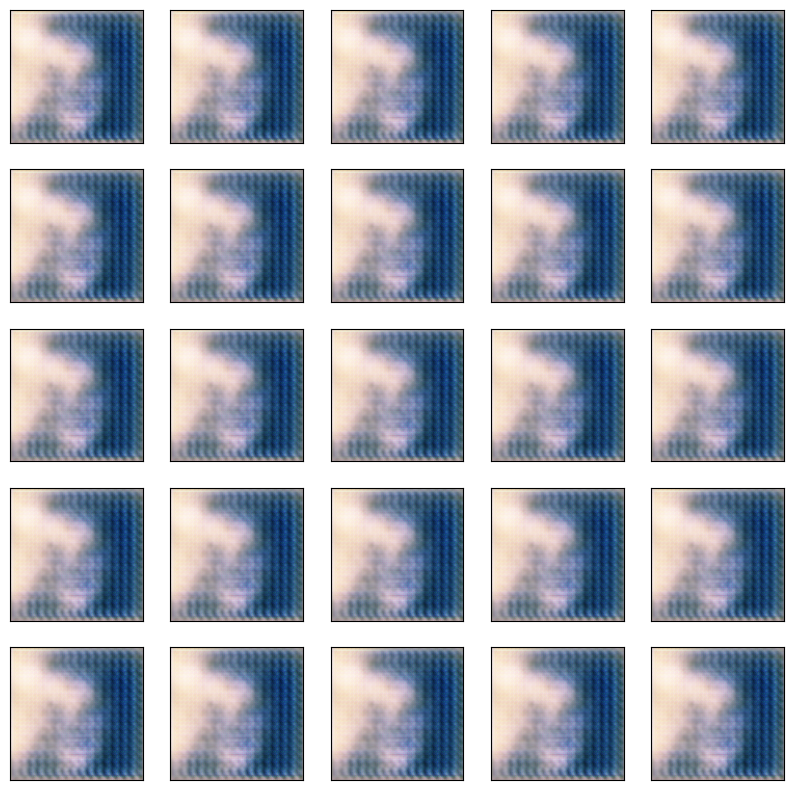

...

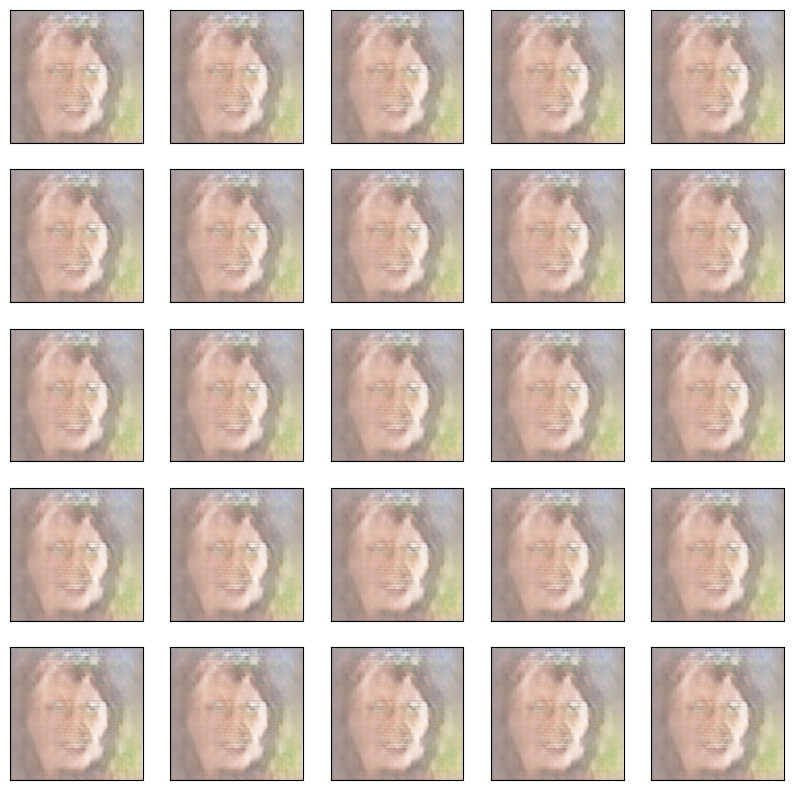

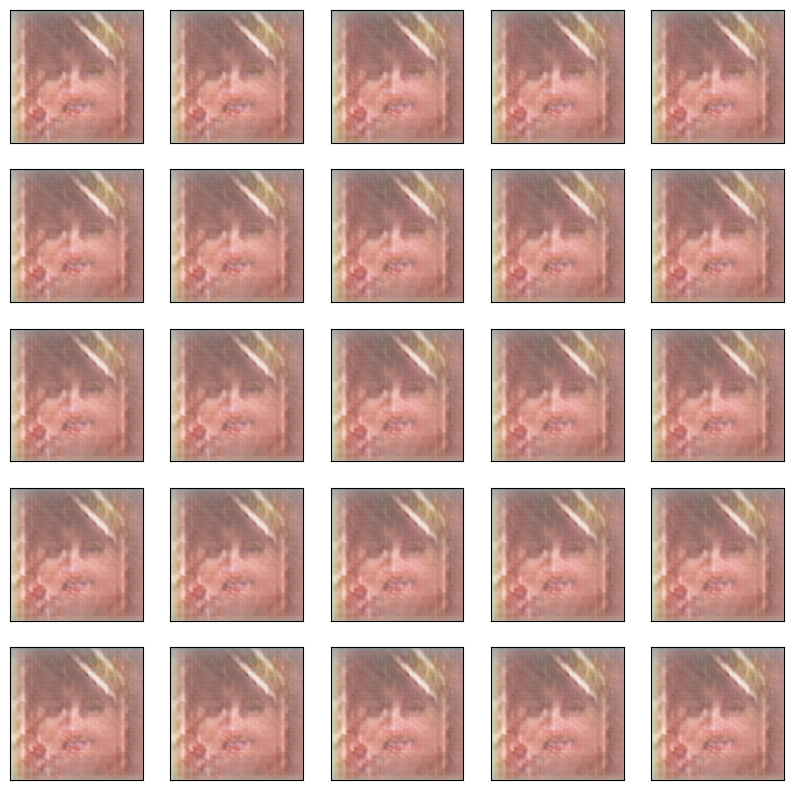

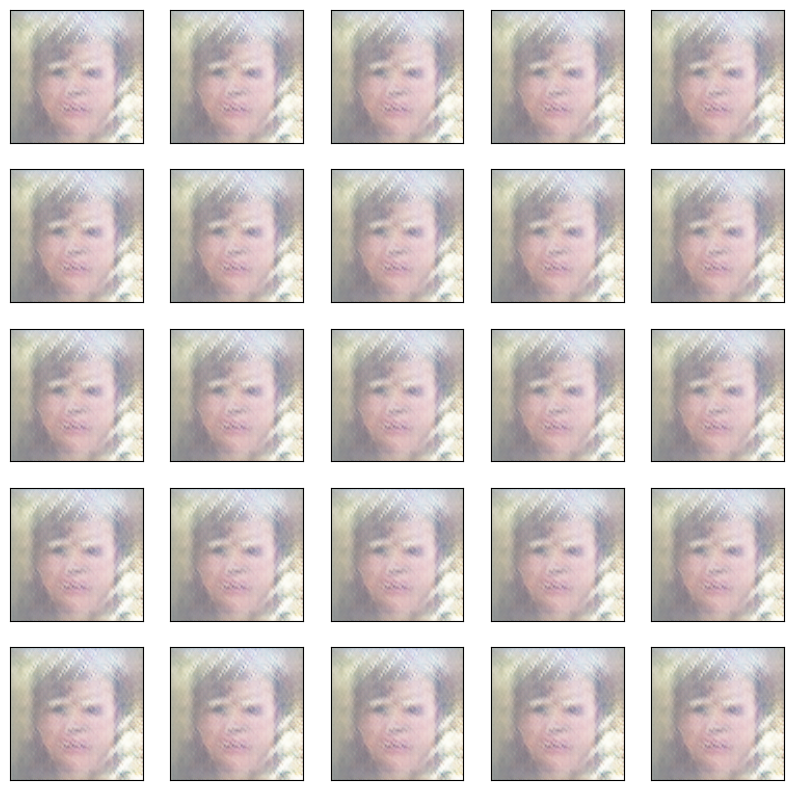

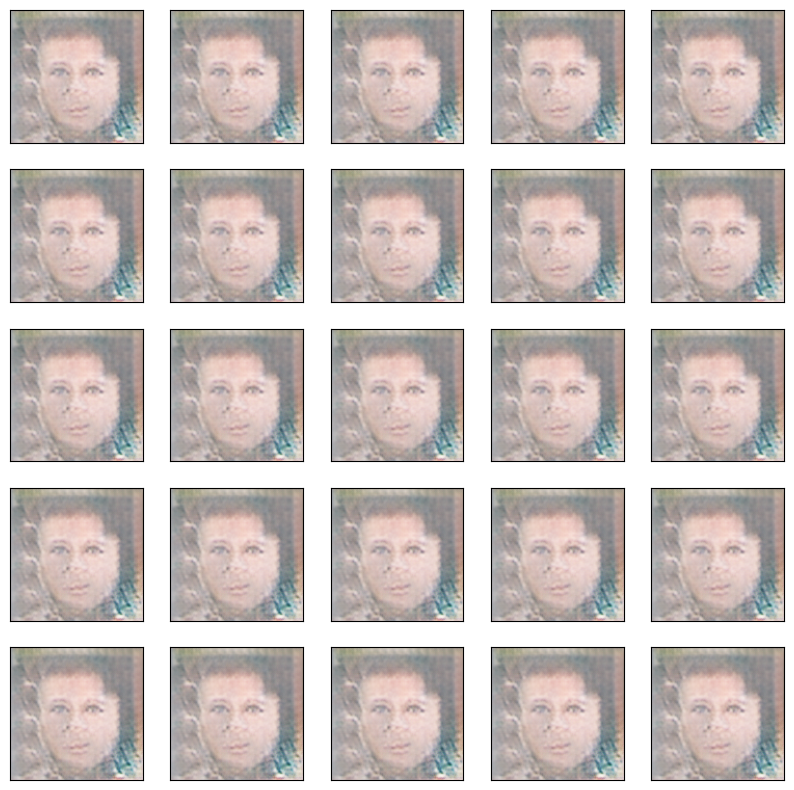

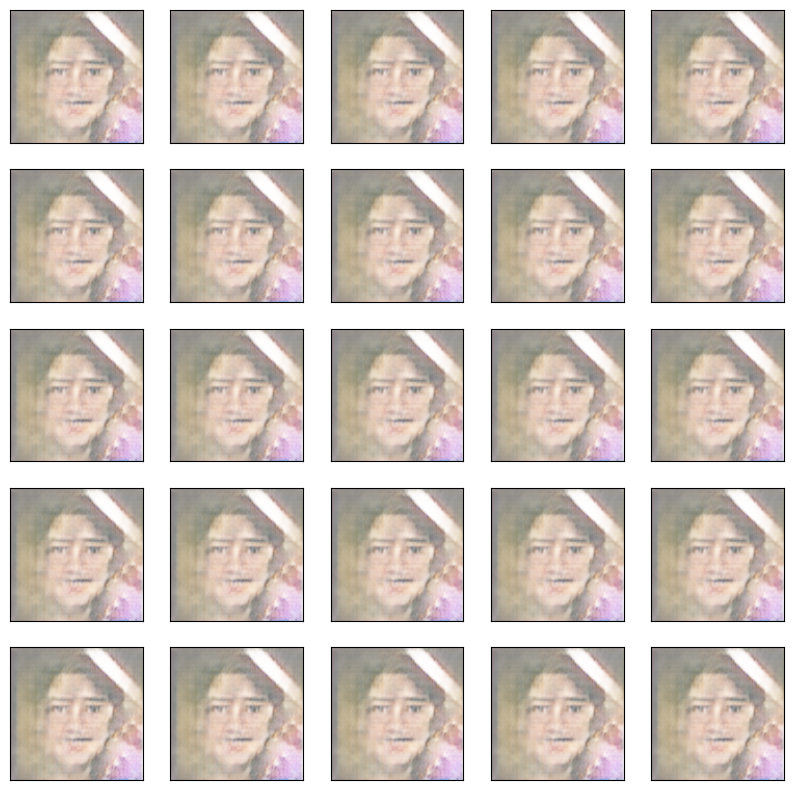

In [41]:
final_train(EPOCHS, batches)

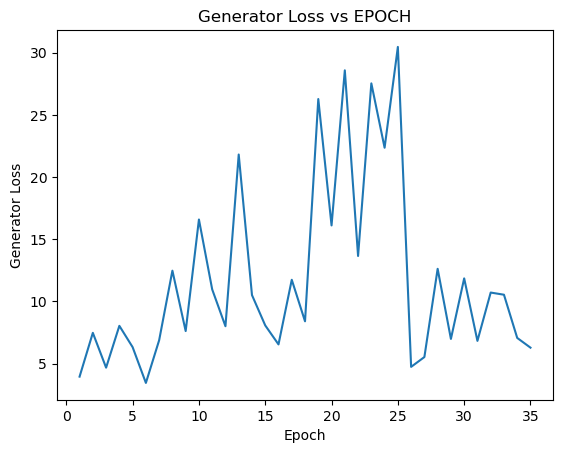

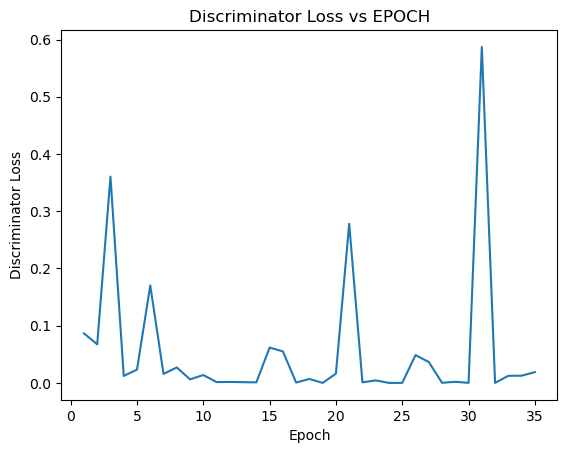

In [42]:
plot_loss(gen_loss_list, disc_loss_list, epoch_list)

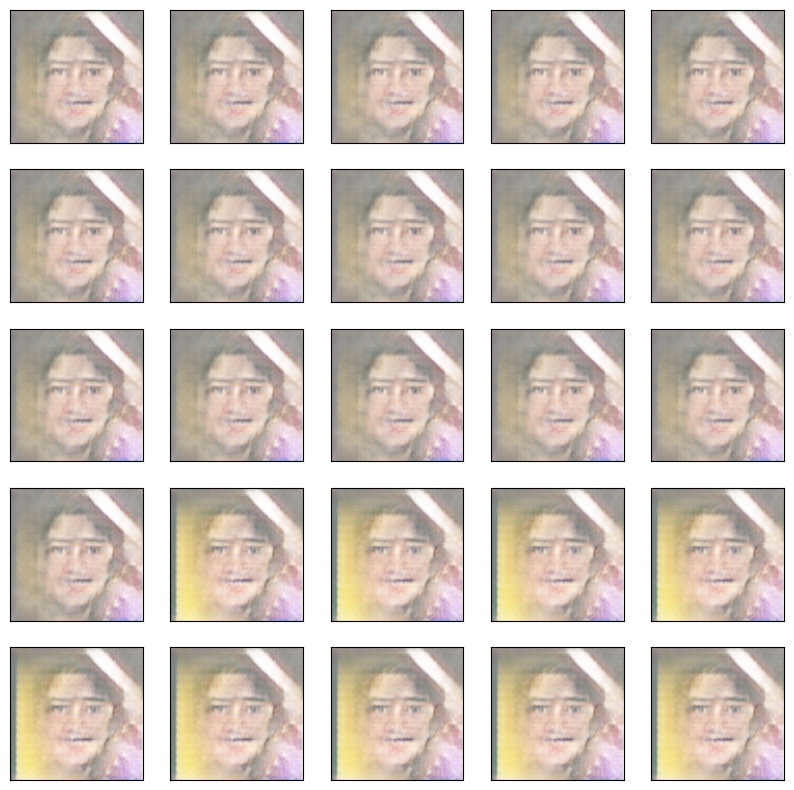

In [71]:
generate_images(5)